In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
os.chdir('/data/lola/shockle/data_for_paper_attempt2/no_pymc')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_mtdreamzs_12chain_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_mtdreamzs_12chain_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_mtdreamzs_12chain_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_mtdreamzs_12chain_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-789224.54225355]
 [-789224.54225355]
 [-789224.54225355]
 ..., 
 [  -4722.26851049]
 [  -4722.26851049]
 [  -4722.26851049]]
Logp of trace:  a  chain:  1  =  [-4739.20559043]
Logp of trace:  a  chain:  2  =  [-4734.15909723]
Logp of trace:  a  chain:  3  =  [-4903.51851188]
Logp of trace:  a  chain:  4  =  [-4896.35253373]
Logp of trace:  a  chain:  5  =  [-4936.40665701]
Logp of trace:  a  chain:  6  =  [-5055.7421237]
Logp of trace:  a  chain:  7  =  [-4991.04471908]
Logp of trace:  a  chain:  8  =  [-5002.75816759]
Logp of trace:  a  chain:  9  =  [-4743.18629516]
Logp of trace:  a  chain:  10  =  [-4923.19614841]
Logp of trace:  a  chain:  11  =  [-5001.98467832]
Logp of trace:  b  chain: 0 =  [[-789278.43857546]
 [-789278.43857546]
 [-789278.43857546]
 ..., 
 [  -4723.96400683]
 [  -4723.96400683]
 [  -4723.96400683]]
Logp of trace:  b  chain:  1  =  [-4766.96733496]
Logp of trace:  b  chain:  2  =  [-4735.69166286]
Logp of trace:  b  chain:  3  =

In [5]:
from earm_exp_parameters import earm_rates
uni_idx = []
norm_idx = []
uni_n = 0
norm_n = 0
for i, param in enumerate(model.parameters_rules()):
    if earm_rates[param.name]['type'] == 'uniform':
        uni_idx.append(i)
        uni_n += 1
    elif earm_rates[param.name]['type'] == 'normal':
        norm_idx.append(i)
        norm_n += 1

kf mito:  -14.8452186131  -  0.154781386928
kr mito:  -4.15478138693  -  13.8452186131
kf cyto:  -16.0001205731  -  -1.00012057306
kr cyto:  -2.99987942694  -  15.0001205731


In [6]:
traces['b'][0][:,72]

array([-8.41457666, -8.41457666, -8.41457666, ..., -8.21248825,
       -8.21248825, -8.21248825])

In [7]:
traces['a'][0][:,72]

array([-8.19258892, -8.19258892, -8.19258892, ..., -6.02811845,
       -6.02811845, -6.02811845])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    uni_param_n = 0
    norm_param_n = uni_n
    for i, param in enumerate(model.parameters_rules()):
        if i in uni_idx:
            param_trace_dict_a[param.name] = [traces[run][chain][:,uni_param_n] for chain in range(len(traces[run]))]
            uni_param_n += 1
        else:
            param_trace_dict_a[param.name] = [traces[run][chain][:,norm_param_n] for chain in range(len(traces[run]))]
            norm_param_n += 1
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  94  of  105  parameters.
Percent of parameters with GR below 1.2:  89.5238095238
Number of parameters with GR below 1.1:  87  of  105  parameters.
Percent of parameters with GR below 1.1:  82.8571428571


[94, 89.52380952380953, 87, 82.85714285714286]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  98  of  105  parameters.
Percent of parameters with GR below 1.2:  93.3333333333
Number of parameters with GR below 1.1:  95  of  105  parameters.
Percent of parameters with GR below 1.1:  90.4761904762


[98, 93.33333333333333, 95, 90.47619047619048]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  100  of  105  parameters.
Percent of parameters with GR below 1.2:  95.2380952381
Number of parameters with GR below 1.1:  93  of  105  parameters.
Percent of parameters with GR below 1.1:  88.5714285714


[100, 95.23809523809523, 93, 88.57142857142857]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  97  of  105  parameters.
Percent of parameters with GR below 1.2:  92.380952381
Number of parameters with GR below 1.1:  91  of  105  parameters.
Percent of parameters with GR below 1.1:  86.6666666667


[97, 92.38095238095238, 91, 86.66666666666667]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-10.35539904, -10.35539904, -10.35539904, ...,  -8.49135348,
         -8.49135348,  -8.49135348]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -8.2804983 ,
        -8.2804983 , -8.2804983 ]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -7.36618068,
        -7.36618068, -7.36618068]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -8.87363393,
        -8.87363393, -8.87363393]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -7.27881133,
        -7.27881133, -7.27881133]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -8.96508592,
        -8.96508592, -8.96508592]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -9.33623093,
        -9.33623093, -9.33623093]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -8.78393624,
        -8.78393624, -8.78393624]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -7.02440173,
        -7.02440173, -7.02440173]),
 array([-8.96607048, -8.96607048, -8.96607048, ..., -7.18820263,
        -7.18820263,

60000
12
60000


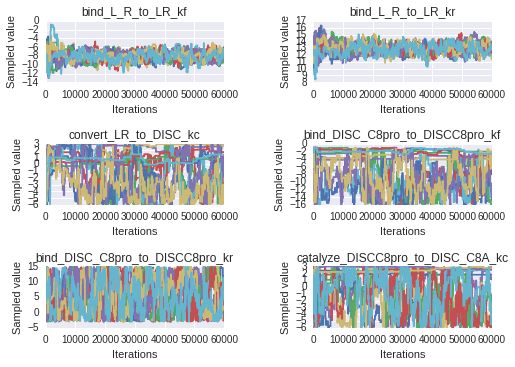

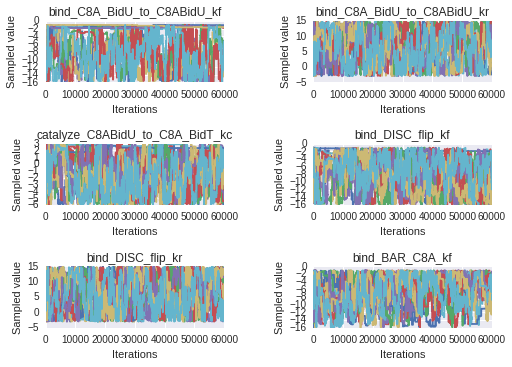

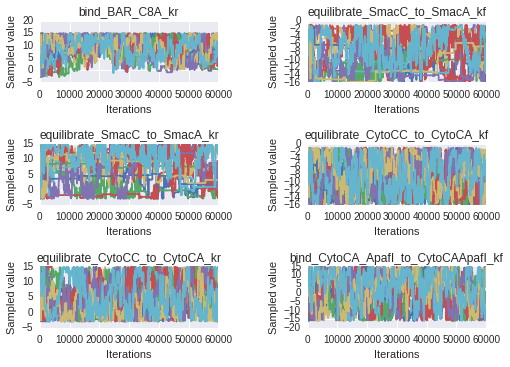

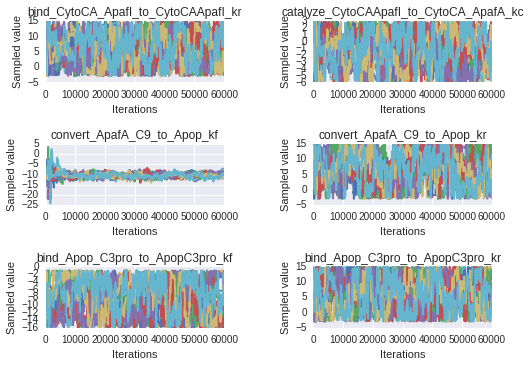

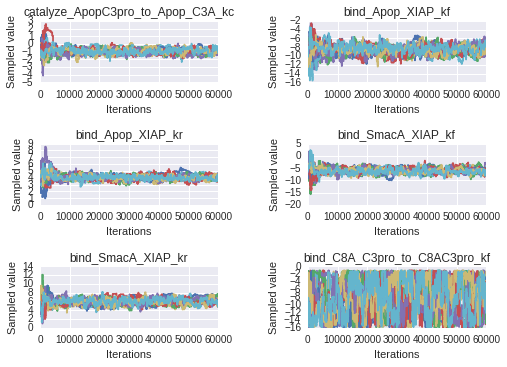

...

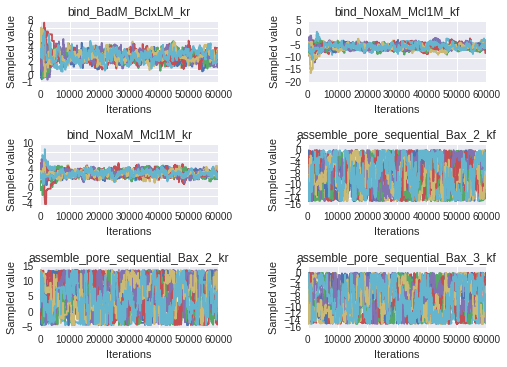

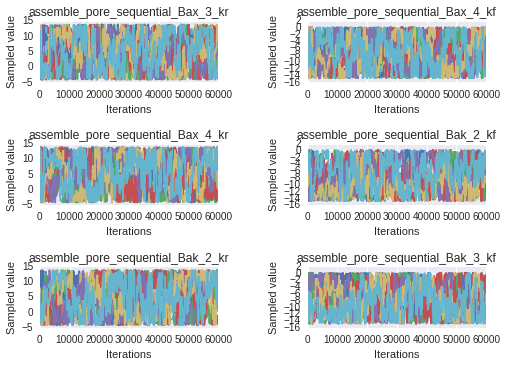

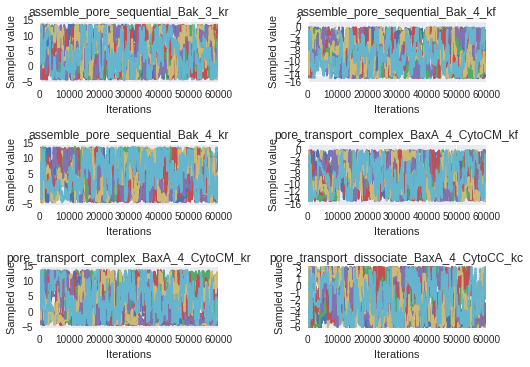

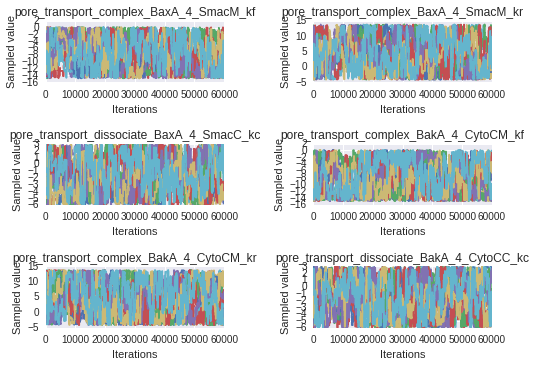

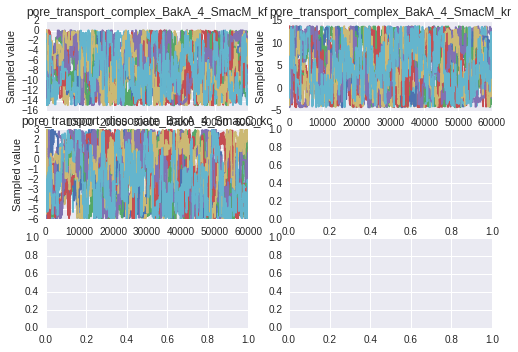

In [14]:
sample_plots(param_trace_dicts['a'])

In [9]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=10000)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=10000)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=10000)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=10000)

In [19]:
trace_arrays = [trace_arr_a, trace_arr_b, trace_arr_c, trace_arr_d]

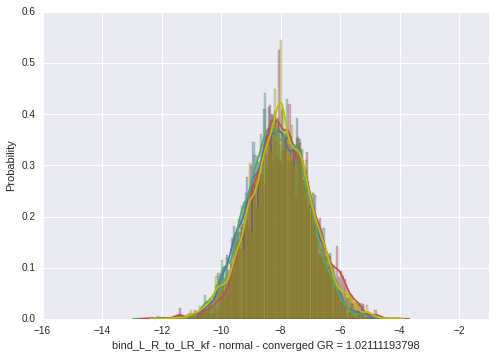

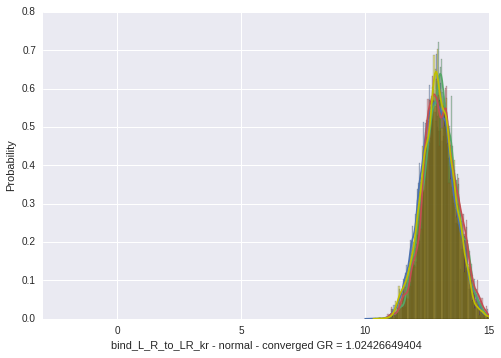

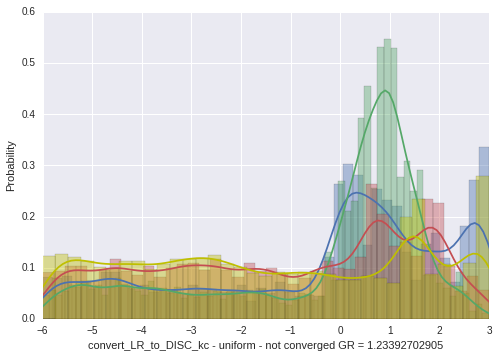

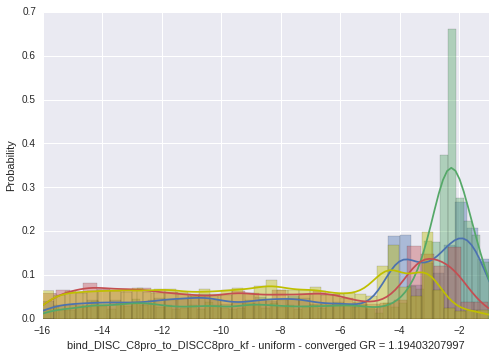

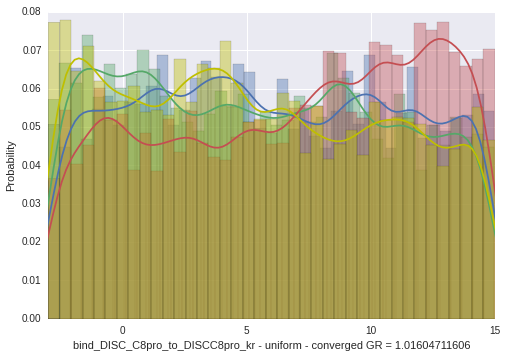

...

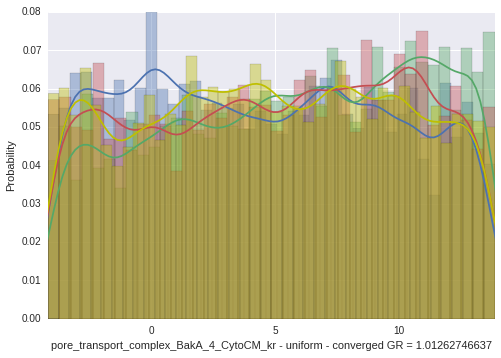

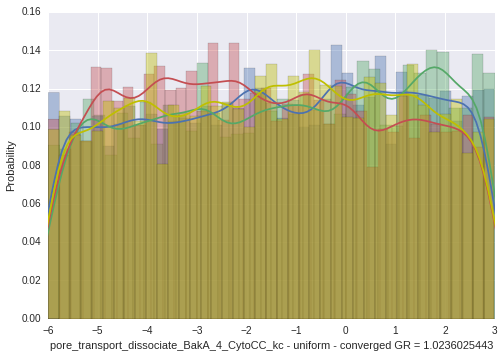

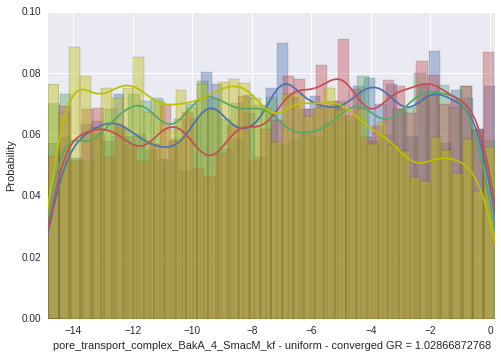

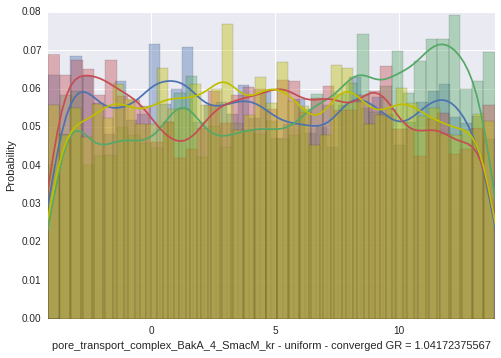

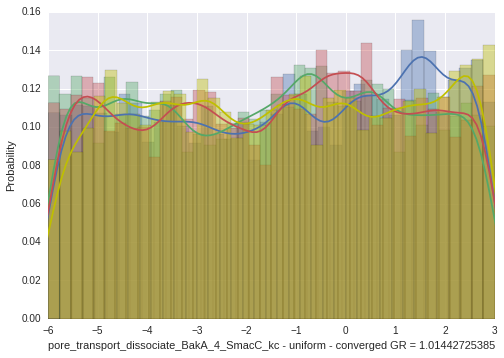

In [18]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True)
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True, color='y')
    if gelman_rubin_dicts['c'][param_name] < 1.2:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - converged GR = '+str(gelman_rubin_dicts['c'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - not converged GR = '+str(gelman_rubin_dicts['c'][param_name]), 'Probability')
    if earm_rates[param_name]['type'] == 'uniform':
        ax.set_xlim([earm_rates[param_name]['lower'], earm_rates[param_name]['upper']])
    elif 'kf' in param_name:
        ax.set_xlim([-16, -1])
    elif 'kr' in param_name:
        ax.set_xlim([-3, 15])
    elif 'kc' in param_name:
        ax.set_xlim([-6, 3])

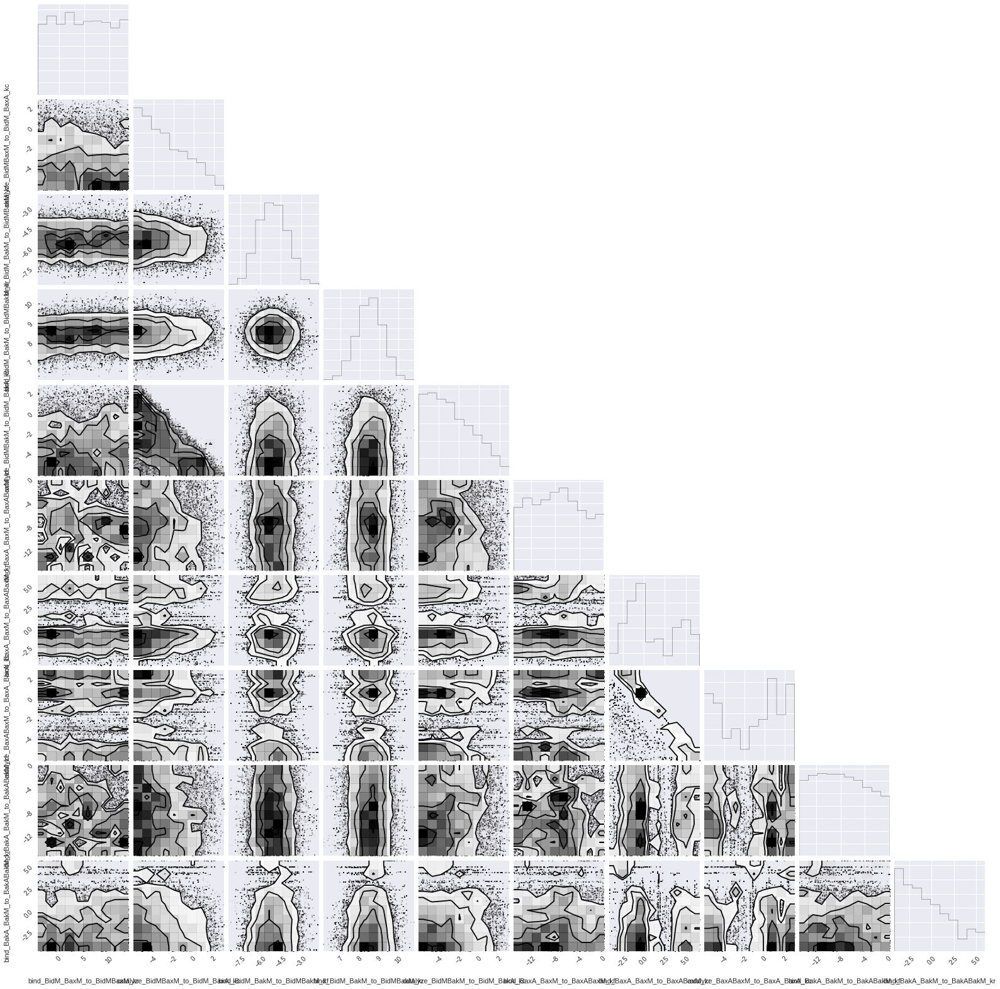

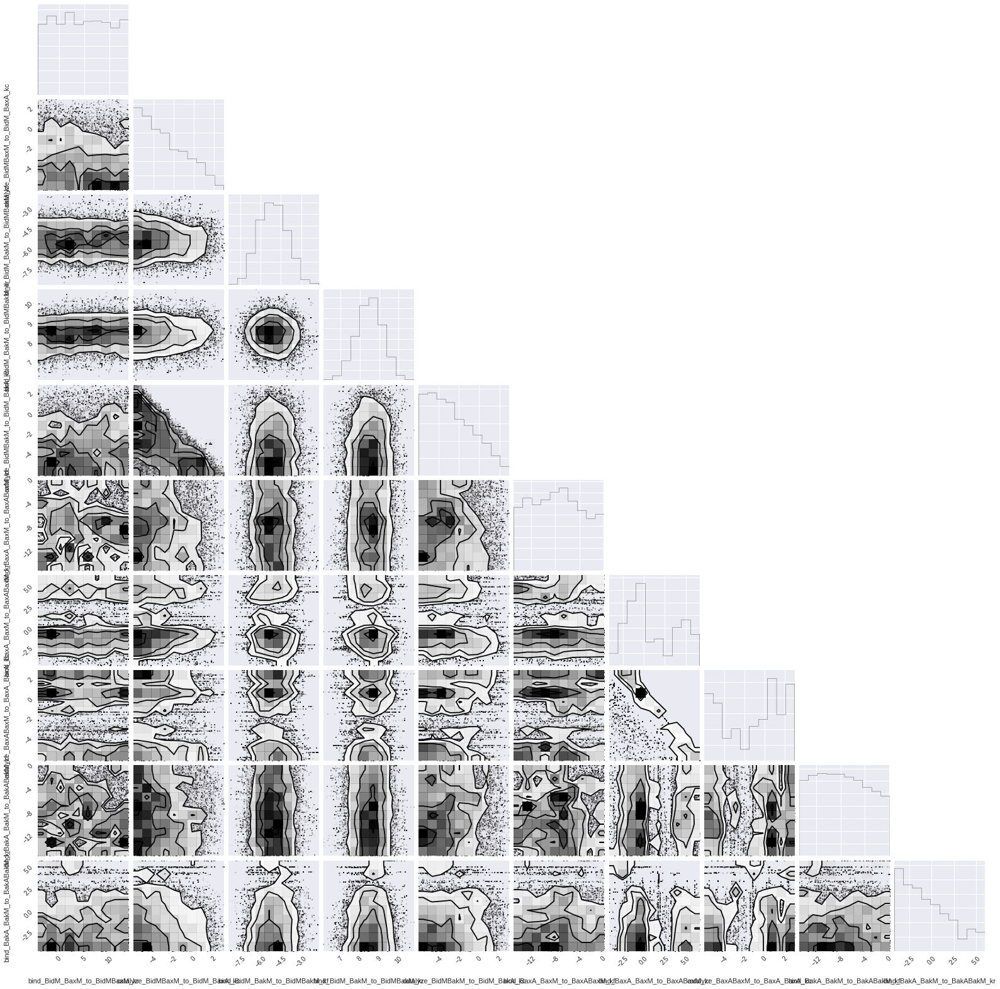

In [17]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [13]:
os.chdir('/home/shockle/emcee')
from emcee import autocorr
autocorr.integrated_time(trace_arr_d)

array([ 78.30459126,  76.9996599 ,  87.43196302,  88.50038473,
        83.27430885,  94.22449881,  95.03824837,  84.01689794,
        83.78502963,  83.00297534,  82.60595468,  84.41027008,
        84.66166413,  91.2271994 ,  93.21542625,  82.7124708 ,
        82.46276193,  81.51108641,  83.01060864,  83.05067663,
        77.06523896,  83.0439906 ,  83.01613643,  82.4435261 ,
        77.16639455,  79.12233079,  79.02518316,  78.96065118,
        79.36742171,  83.36343813,  82.46839888,  78.0088842 ,
        78.12172376,  79.77667457,  82.0633724 ,  83.81594312,
        82.67099544,  76.65422453,  84.69536371,  84.47713163,
        80.19281476,  80.6059806 ,  96.77043785,  96.7073343 ,
        83.26487254,  78.39420305,  80.09431805,  78.57627532,
        85.12435338,  77.57219155,  84.58779425,  83.32127704,
        75.87297471,  76.648571  ,  83.1585592 ,  82.58125719,
        97.15220746,  97.15516338,  82.70752253,  81.97043193,
        83.76560078,  83.70729758,  78.25518998,  77.32